In [1]:
%load_ext autoreload

In [2]:
import pandas as pd
from ast import literal_eval
import protfasta
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%aimport ADpred_LambertTFs_helper

In [3]:
## CHANGE TO OUTPUT PATH
all_predictor_output = "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/consensus_AD_predictor/output/all_predictors_test/all_predictors_test_50/all_predictor_preds.csv"

In [4]:
preds = pd.read_csv(all_predictor_output,
                                        converters = dict(adpred_preds=literal_eval,
                                        paddle_centers=literal_eval,
                                        paddle_preds=literal_eval,
                                        adhunter_centers=literal_eval,
                                        adhunter_preds=literal_eval,
                                        tada_centers=literal_eval,
                                        tada_preds=literal_eval),
                                        index_col = 0)
preds.head(3)

,name,sequence,adpred_preds,paddle_centers,paddle_preds,adhunter_centers,adhunter_preds,tada_centers,tada_preds
0,tr|A0A0B4K6B8|A0A0B4K6B8_DROME,MADDEQFSLCWNNFNTNLSAGFHESLCRGDLVDVSLAAEGQIVKAH...,"[0.37835636734962463, 0.3302136957645416, 0.25...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.09567471, 0.07605115, 0.06260848, 0.0532633...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[136887.55, 134757.55, 130271.09, 106751.88, 9...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.55106246, 0.5248515, 0.5119103, 0.4706206, ..."
1,tr|A0A0B4K7A6|A0A0B4K7A6_DROME,MADDEQFSLCWNNFNTNLSAGFHESLCRGDLVDVSLAAEGQIVKAH...,"[0.30928972363471985, 0.2793668806552887, 0.20...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.1009954, 0.08097347, 0.06707215, 0.05722969...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[136887.55, 134757.55, 130271.09, 106751.88, 9...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.55106246, 0.5248515, 0.5119103, 0.4706206, ..."
2,sp|A0A5S9MMK5|FPEB1_CAEEL,MMTTTVQKNCWRLDQTMLGLEKPGSSDISSSSTDTSAISPISVSSM...,"[0.002819349290803075, 0.0021090556401759386, ...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.11764765, 0.09267676, 0.07918354, 0.0643123...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[27885.117, 31055.277, 32651.422, 43736.38, 47...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.18988474, 0.19800334, 0.20333019, 0.2000658..."


In [5]:
preds["len"] = preds["sequence"].str.len()
preds["uniprotID"] = preds["name"].str.split("|").str[1]
preds[["uniprotID", "len"]].head(3)

,uniprotID,len
0,A0A0B4K6B8,479
1,A0A0B4K7A6,510
2,A0A5S9MMK5,443


# ADPred → intervals

In [6]:
# At least 10 positions abouve 0.8
df_list = []

for i in range(len(preds.index)):
    df_list.append(ADpred_LambertTFs_helper.return_pred_df(preds["adpred_preds"][i], 
                                  0.8, 
                                  10,
                                  preds["sequence"][i],
                                  preds["name"][i]))
adpred_intervals = pd.concat(df_list)
adpred_intervals["uniprotID"] = adpred_intervals["GeneName"].str.split("|").str[1]
adpred_intervals = adpred_intervals[["uniprotID", "Start", "End"]]
adpred_intervals["predictor"] = "ADPred"
adpred_intervals = adpred_intervals.reset_index(drop = True)
adpred_intervals

,uniprotID,Start,End,predictor
0,A0A0B4K6B8,7.0,25.0,ADPred
1,A0A0B4K7A6,7.0,25.0,ADPred
2,A0A5S9MMK5,221.0,232.0,ADPred
3,A0A5S9MMK5,292.0,301.0,ADPred
4,Q86B87,7.0,25.0,ADPred
5,Q6NP69,865.0,884.0,ADPred
6,Q8CI03,326.0,338.0,ADPred
7,Q9XWR1,484.0,493.0,ADPred
8,A8XJ98,275.0,296.0,ADPred


# PADDLE → intervals

In [7]:
def true_intervals_longer_than_5(bool_list):
    intervals = []
    start = None

    for i, val in enumerate(bool_list):
        if val:
            if start is None:
                start = i
        else:
            if start is not None:
                if i - start >= 5:
                    intervals.append((start + 26 - 1, i + 26 - 1))
                start = None

    # Catch any interval that goes to the end
    if start is not None and len(bool_list) - start >= 5:
        intervals.append((start + 26 - 1, len(bool_list) + 26 - 1)) 

    return intervals


In [8]:
# At least 5 consecutive tiles with score > 4

# Expand so that one row per tile
paddle_preds = preds[["name", "paddle_preds", "paddle_centers"]]
paddle_preds_expanded = paddle_preds.explode(['paddle_preds', 'paddle_centers']).reset_index()
paddle_preds_expanded["Start"] = paddle_preds_expanded["paddle_centers"] - 53/2
paddle_preds_expanded["End"] = paddle_preds_expanded["paddle_centers"] + 53/2

# Filter to only active tiles
paddle_preds_expanded["active"] = paddle_preds_expanded["paddle_preds"] > 4

# List of active or not
active_lists = pd.DataFrame(paddle_preds_expanded.groupby("name")["active"].agg(list)).reset_index()

# Return intervals with at least 5 consecutive tiles
active_lists["intervals"] = active_lists["active"].apply(lambda lst: true_intervals_longer_than_5(lst))
active_lists["num_intervals"] = [len(_) for _ in active_lists["intervals"]]

# Keep rows with predicted AD
final_preds = active_lists[active_lists["num_intervals"] > 0]
final_preds["uniprotID"] = final_preds["name"].str.split("|").str[1]
final_preds_expanded = final_preds[["uniprotID", "intervals"]].explode("intervals")

# Formatting
final_preds_expanded["Start"] = [_[0] for _ in final_preds_expanded["intervals"]]
final_preds_expanded["End"] = [_[1] for _ in final_preds_expanded["intervals"]]
final_preds_expanded = final_preds_expanded[["uniprotID", "Start", "End"]]
paddle_intervals = final_preds_expanded
paddle_intervals["predictor"] = "PADDLE"
paddle_intervals

/tmp/ipykernel_1268832/2094350933.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_preds["uniprotID"] = final_preds["name"].str.split("|").str[1]


,uniprotID,Start,End,predictor
1,A8XJ98,259,267,PADDLE
7,P40798,161,173,PADDLE
49,Q6NP69,260,295,PADDLE
49,Q6NP69,757,788,PADDLE


# ADHunter → intervals

In [9]:
# From preparing TADA preds

def return_merged_row(uniprotID, df):
    # Only look at rows with the same uniprot ID
    same_uniprotID_rows = df[df["uniprotID"] == uniprotID]
    same_uniprotID_rows = same_uniprotID_rows.sort_values(by = "Start")
    
    # Final dataframe columns
    new_starts = []
    new_ends = []
    orig_uniprotIDs = []
    
    # Current row's values
    curr_start = -1
    curr_end = -1
    curr_orig_uniprotIDs = []
    
    for i in same_uniprotID_rows.index:
        # Merge current row with next row
        if curr_end >= same_uniprotID_rows.loc[i]["Start"]:
            curr_end = max(curr_end, same_uniprotID_rows.loc[i]["End"])
        
        # Don't merge current row with next row
        else: 
            new_starts.append(curr_start)
            new_ends.append(curr_end)

            curr_orig_uniprotIDs = [str(c) for c in curr_orig_uniprotIDs]            
            
            curr_start = same_uniprotID_rows.loc[i]["Start"]
            curr_end = same_uniprotID_rows.loc[i]["End"]
    
    # Append the last values
    new_starts.append(curr_start)
    new_ends.append(curr_end)
    
    

    # curr_matching_isoforms = [c for c in curr_matching_isoforms]
    curr_orig_uniprotIDs = [str(c) for c in curr_orig_uniprotIDs]
    orig_uniprotIDs.append(" / ".join(curr_orig_uniprotIDs))
    
    # Remove the first (because it is just -1 or "")
    new_starts = new_starts[1:]
    new_ends = new_ends[1:]
    orig_uniprotIDs = orig_uniprotIDs[1:]
    
    return pd.DataFrame({"uniprotID" :uniprotID,
                         "Start": new_starts,
                        "End": new_ends
                        })

In [10]:
# Expanding so one row per tiles
ADHunter_preds_expanded = preds[["name", "adhunter_centers", "adhunter_preds"]].explode(['adhunter_centers', 'adhunter_preds']).reset_index()
ADHunter_preds_expanded["Start"] = ADHunter_preds_expanded["adhunter_centers"] - 20
ADHunter_preds_expanded["End"] = ADHunter_preds_expanded["adhunter_centers"] + 20

# Filtering to active rows
active_preds = ADHunter_preds_expanded[ADHunter_preds_expanded["adhunter_preds"] > 100000]
active_preds["uniprotID"] = active_preds["name"].str.split("|").str[1]
active_tile_coords = active_preds[["uniprotID", "Start", "End"]]
active_tile_coords.reset_index(inplace= True,drop=True)

# Merging itnervals on same protein
dfs = []
i = 0
for uniprotID in active_tile_coords["uniprotID"].unique():
    dfs.append(return_merged_row(uniprotID, active_tile_coords))

merged_active_tile_coords = pd.concat(dfs)
merged_active_tile_coords = merged_active_tile_coords.reset_index(drop = True)
adhunter_intervals = merged_active_tile_coords
adhunter_intervals["predictor"] = "ADHunter"
adhunter_intervals

/tmp/ipykernel_1268832/1124935459.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  active_preds["uniprotID"] = active_preds["name"].str.split("|").str[1]


,uniprotID,Start,End,predictor
0,A0A0B4K6B8,0.0,43.0,ADHunter
1,A0A0B4K6B8,71.0,111.0,ADHunter
2,A0A0B4K7A6,0.0,43.0,ADHunter
3,A0A0B4K7A6,71.0,111.0,ADHunter
4,A0A5S9MMK5,140.0,181.0,ADHunter
5,A0A5S9MMK5,257.0,321.0,ADHunter
6,Q4VC44,561.0,601.0,ADHunter
7,Q86B87,0.0,43.0,ADHunter
8,Q86B87,71.0,111.0,ADHunter
9,Q6NP69,22.0,64.0,ADHunter


# TADA → intervals

In [11]:
# Expanding so one row per tiles
tada_preds_expanded = preds[["name", "tada_centers", "tada_preds"]].explode(['tada_centers', 'tada_preds']).reset_index()
tada_preds_expanded["Start"] = tada_preds_expanded["tada_centers"] - 20
tada_preds_expanded["End"] = tada_preds_expanded["tada_centers"] + 20

# Filtering to active rows
active_preds = tada_preds_expanded[tada_preds_expanded["tada_preds"] > 0.4]
active_preds["uniprotID"] = active_preds["name"].str.split("|").str[1]
active_tile_coords = active_preds[["uniprotID", "Start", "End"]]
active_tile_coords.reset_index(inplace= True,drop=True)

# Merging intervals on same protein
dfs = []
i = 0
for uniprotID in active_tile_coords["uniprotID"].unique():
    dfs.append(return_merged_row(uniprotID, active_tile_coords))

merged_active_tile_coords = pd.concat(dfs)
merged_active_tile_coords = merged_active_tile_coords.reset_index(drop = True)
tada_intervals = merged_active_tile_coords
tada_intervals["predictor"] = "TADA"
tada_intervals

/tmp/ipykernel_1268832/1642989823.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  active_preds["uniprotID"] = active_preds["name"].str.split("|").str[1]


,uniprotID,Start,End,predictor
0,A0A0B4K6B8,0.0,43.0,TADA
1,A0A0B4K6B8,297.0,354.0,TADA
2,A0A0B4K7A6,0.0,43.0,TADA
3,A0A0B4K7A6,297.0,354.0,TADA
4,A0A5S9MMK5,137.0,188.0,TADA
...,...,...,...,...
64,D6R927,178.0,238.0,TADA
65,D6R927,290.0,338.0,TADA
66,P40798,124.0,190.0,TADA
67,P40798,729.0,770.0,TADA


# Running composition model

In [12]:
import os

Using existing Tiling DF at ../data/TilingDFs/tmp_size_39_space_1_AAs_W,F,Y,M,L,Q.csv
There are 50 proteins
Using existing Tiling DF at ../data/TilingDFs/tmp_size_39_space_1_AAs_W,F,Y,M,L,Q.csv
1529     6
1530     6
1710     6
1711     6
1712     6
        ..
14199    8
14200    8
14201    7
14202    7
14203    7
Name: AllHydros, Length: 86, dtype: int64
seaborn adjustment: -19
There are 86 regions of length 39 AA as extreme or more than this AD
These regions come from 15 proteins

---
There are 16 predicted candidate AD regions on 15 TFs
There are 50 proteins
50
0     tr|A0A0J9YTV5|A0A0J9YTV5_MOUSE
1              sp|Q8CI03|FWCH1_MOUSE
2     tr|A0A7P0T947|A0A7P0T947_HUMAN
3                sp|Q06330|SUH_HUMAN
4             tr|D6RF98|D6RF98_HUMAN
5     tr|A0A7P0TBJ4|A0A7P0TBJ4_HUMAN
6             tr|E9Q7W0|E9Q7W0_MOUSE
7                sp|P31266|SUH_MOUSE
8             tr|D6R927|D6R927_HUMAN
9              sp|Q4VC44|FWCH1_HUMAN
10             sp|Q4VC44|FWCH1_HUMAN
11    tr|A0A7P0T9Y9|A0A

,uniprotID,Start,End,predictor
0,A0A0J9YTV5,209,251,Composition
1,Q8CI03,179,218,Composition
2,A0A7P0T947,167,209,Composition
3,Q06330,202,244,Composition
4,D6RF98,188,230,Composition
5,A0A7P0TBJ4,167,209,Composition
6,E9Q7W0,187,229,Composition
7,P31266,228,270,Composition
8,D6R927,188,230,Composition
9,Q4VC44,211,251,Composition


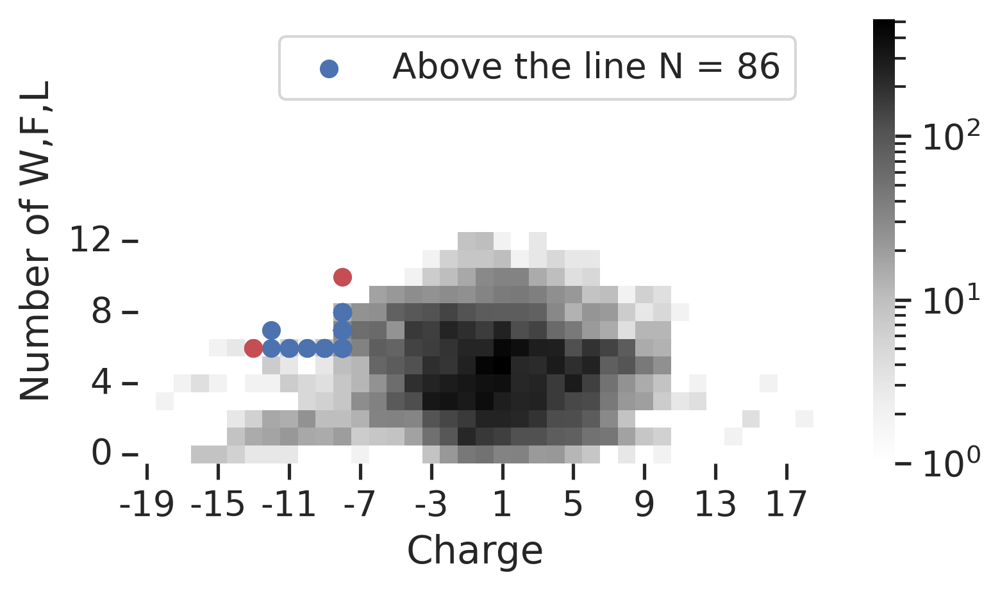

In [14]:
os.chdir("../../../../predictors/Sanjana_predictor/notebooks/")
%aimport AD_predictor_tools

protfasta.write_fasta(dict(zip(preds["name"], preds["sequence"])), "tmp.fasta")

composition_preds = AD_predictor_tools.make_predictions(folder_name="predictions/",
                        inputfilename="tmp.fasta",
                        slope=1,
                        lower_corner_c='VP16',lower_corner_h=6,
                        upper_corner_c=-8,upper_corner_h='CITED2',
                        LowerCorner_slope1='inf', LowerCorner_slope2=0,
                        UpperCorner_slope1='inf', UpperCorner_slope2='inf',
                        composition=['W','F','L'],
                        window_size=39,
                        window_spacing=1,
                        propset=['Charge','AllHydros'])
composition_preds["uniprotID"] = composition_preds["GeneName"].str.split("|").str[1]
composition_intervals = composition_preds[["uniprotID", "Start", "End"]]
composition_intervals["predictor"] = "Composition"
composition_intervals

# Combining intervals to consensus traces

In [15]:
all_models = pd.concat([adhunter_intervals, tada_intervals, adpred_intervals, composition_intervals, paddle_intervals])
all_models["Start"] = all_models["Start"].astype(int)
all_models["End"] = all_models["End"].astype(int)
all_models

,uniprotID,Start,End,predictor
0,A0A0B4K6B8,0,43,ADHunter
1,A0A0B4K6B8,71,111,ADHunter
2,A0A0B4K7A6,0,43,ADHunter
3,A0A0B4K7A6,71,111,ADHunter
4,A0A5S9MMK5,140,181,ADHunter
...,...,...,...,...
15,Q86B87,526,576,Composition
1,A8XJ98,259,267,PADDLE
7,P40798,161,173,PADDLE
49,Q6NP69,260,295,PADDLE


In [16]:
def combine_intervals(uniprotID, preds):
    all_models_rows = all_models[all_models["uniprotID"] == uniprotID]
    TF_length = preds[preds["uniprotID"] == uniprotID]["len"].iloc[0].astype(int)
    
    if len(all_models_rows) > 0:
        preds = []

        for i in range(len(all_models_rows)):
            row_preds = np.zeros(TF_length)
            row = all_models_rows.iloc[i]
            row_preds[row["Start"]:row["End"]] = 1
            preds.append(row_preds)

        all_models_rows["preds"] = preds

        return sum(all_models_rows["preds"]) / 5

    else:
        return np.zeros(TF_length)
        

In [17]:
preds["combined_preds"] = preds["uniprotID"].apply(lambda id: combine_intervals(id, preds))
preds

,name,sequence,adpred_preds,paddle_centers,paddle_preds,adhunter_centers,adhunter_preds,tada_centers,tada_preds,len,uniprotID,combined_preds
0,tr|A0A0B4K6B8|A0A0B4K6B8_DROME,MADDEQFSLCWNNFNTNLSAGFHESLCRGDLVDVSLAAEGQIVKAH...,"[0.37835636734962463, 0.3302136957645416, 0.25...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.09567471, 0.07605115, 0.06260848, 0.0532633...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[136887.55, 134757.55, 130271.09, 106751.88, 9...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.55106246, 0.5248515, 0.5119103, 0.4706206, ...",479,A0A0B4K6B8,"[0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.6, 0.6, ..."
1,tr|A0A0B4K7A6|A0A0B4K7A6_DROME,MADDEQFSLCWNNFNTNLSAGFHESLCRGDLVDVSLAAEGQIVKAH...,"[0.30928972363471985, 0.2793668806552887, 0.20...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.1009954, 0.08097347, 0.06707215, 0.05722969...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[136887.55, 134757.55, 130271.09, 106751.88, 9...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.55106246, 0.5248515, 0.5119103, 0.4706206, ...",510,A0A0B4K7A6,"[0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.6, 0.6, ..."
2,sp|A0A5S9MMK5|FPEB1_CAEEL,MMTTTVQKNCWRLDQTMLGLEKPGSSDISSSSTDTSAISPISVSSM...,"[0.002819349290803075, 0.0021090556401759386, ...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.11764765, 0.09267676, 0.07918354, 0.0643123...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[27885.117, 31055.277, 32651.422, 43736.38, 47...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.18988474, 0.19800334, 0.20333019, 0.2000658...",443,A0A5S9MMK5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,sp|Q4VC44|FWCH1_HUMAN,MPLPEPSEQEGESVKAGQEPSPKPGTDVIPAAPRKPREFSKLVLLT...,"[0.00030047251493670046, 0.0003258617944084108...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[-0.024983024, -0.030793944, -0.03603414, -0.0...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[29862.45, 26901.766, 47789.38, 60017.99, 6132...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.17019404, 0.16038708, 0.1567993, 0.15776016...",716,Q4VC44,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,sp|Q86B87|MMD4_DROME,MADDEQFSLCWNNFNTNLSAGFHESLCRGDLVDVSLAAEGQIVKAH...,"[0.37835636734962463, 0.3302136957645416, 0.25...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.09732647, 0.07743502, 0.063799724, 0.054289...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[136887.55, 134757.55, 130271.09, 106751.88, 9...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.55106246, 0.5248515, 0.5119103, 0.4706206, ...",610,Q86B87,"[0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.6, 0.6, ..."
5,sp|Q18225|FLH2_CAEEL,MVDTMMNTNTDGVTAVPPIFPLPSTTPNRNNNNELAMLAQKQIVAG...,"[0.001044573960825801, 0.0013119170907884836, ...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.06709752, 0.06280216, 0.05682077, 0.0500525...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[44058.375, 29017.281, 26453.473, 31963.145, 3...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.22886878, 0.20127878, 0.18595667, 0.1875345...",470,Q18225,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
6,tr|Q6NP69|Q6NP69_DROME,METPVEEHGMDLTKVSVVRSAKGVDMLCVDDYLYHFDRIGRNNTYR...,"[0.0011038038646802306, 0.0008723376085981727,...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[0.44124603, 0.44240856, 0.43764994, 0.4233188...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[86817.99, 55663.594, 59979.6, 64908.75, 67949...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[0.3425563, 0.30508795, 0.28328484, 0.28567895...",1045,Q6NP69,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
7,sp|Q8CI03|FWCH1_MOUSE,MPLPEPSEQDCESLRAGQEPSVGARKPQESSNLVPARDKERPKPTD...,"[0.0010221252450719476, 0.0010518376948311925,...","[27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34....","[-0.10592838, -0.10620161, -0.10493868, -0.098...","[20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27....","[15545.54, 13997.528, 13355.384, 12

In [21]:
def plot_all_predictors(preds, index=0):
    """
    Plots combined and individual predictor traces for a given index from the preds DataFrame.

    Parameters:
        preds (pd.DataFrame): DataFrame with predictor outputs and centers.
        index (int): Index of the row to plot.
        title (str): Title for the plot.
    """
    plt.figure(dpi=300, figsize=(10, 3))
    palette = sns.color_palette('colorblind', 5)

    title = preds['name'].iloc[0]

    # Primary y-axis plot (combined predictions)
    ax = sns.lineplot(
        x=range(len(preds["combined_preds"].iloc[index])), 
        y=preds["combined_preds"].iloc[index], 
        color=palette[0], 
        label="Combined"
    )
    ax.set_ylim(0, 1)

    # Secondary y-axis
    ax2 = ax.twinx()
    sns.lineplot(
        x=preds["paddle_centers"].iloc[index], 
        y=np.array(preds["paddle_preds"].iloc[index]) / 4, 
        label="PADDLE", 
        ax=ax2, 
        color=palette[1]
    )
    sns.lineplot(
        x=preds["adhunter_centers"].iloc[index], 
        y=np.array(preds["adhunter_preds"].iloc[index]) / 100000, 
        label="ADHunter", 
        ax=ax2, 
        color=palette[2]
    )
    sns.lineplot(
        x=preds["tada_centers"].iloc[index], 
        y=np.array(preds["tada_preds"].iloc[index]) / 0.4, 
        label="TADA", 
        ax=ax2, 
        color=palette[3]
    )
    sns.lineplot(
        x=range(len(preds["adpred_preds"].iloc[index])), 
        y=np.array(preds["adpred_preds"].iloc[index]) / 0.8, 
        label="ADPred", 
        ax=ax2, 
        color=palette[4]
    )
    prot_uniprotID = preds["uniprotID"].iloc[index]
    compos_preds = composition_intervals[composition_intervals["uniprotID"] == prot_uniprotID]
    for i in compos_preds.index:
        plt.axvspan(compos_preds["Start"].loc[i],compos_preds["End"].loc[i], color = 'gray', alpha = 0.5, label = "Composition Pred")
    compos_preds

    ax2.axhline(1, linestyle="--", color="gray", linewidth=0.8)
    ax2.legend(bbox_to_anchor=(1, 1))
    ax.set_title(title)
    sns.despine()
    plt.tight_layout()
    

In [22]:
all_models[all_models["uniprotID"] == "Q3U6F1"]

,uniprotID,Start,End,predictor
50,Q3U6F1,146,214,ADHunter
51,Q3U6F1,312,370,ADHunter
61,Q3U6F1,160,216,TADA
62,Q3U6F1,269,360,TADA
12,Q3U6F1,167,209,Composition


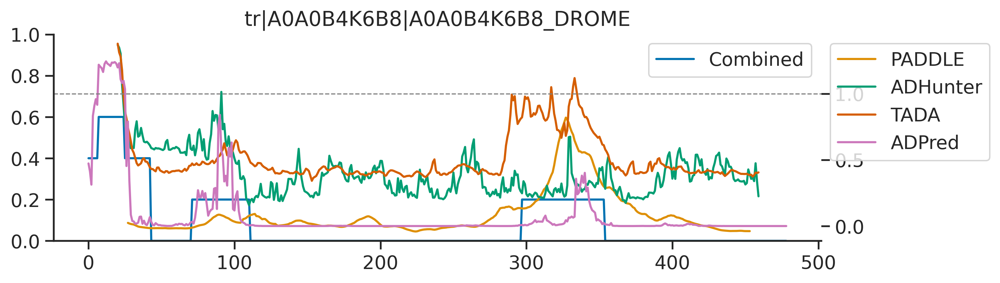

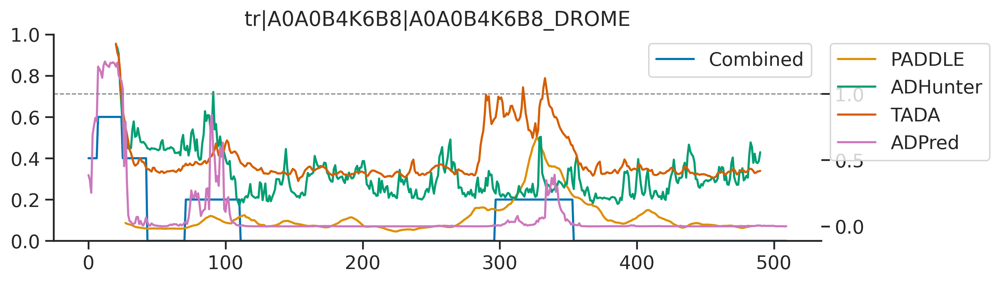

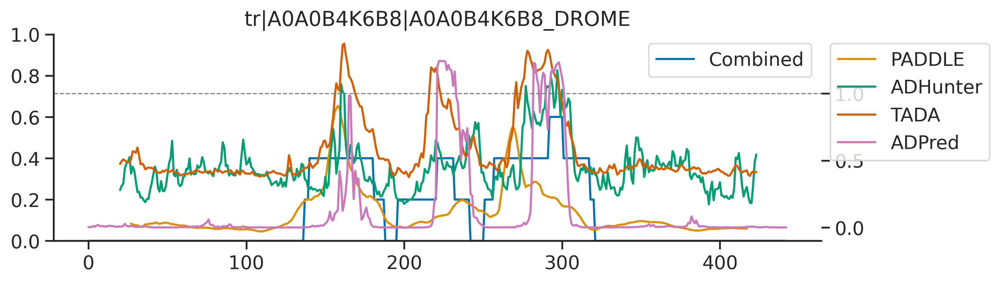

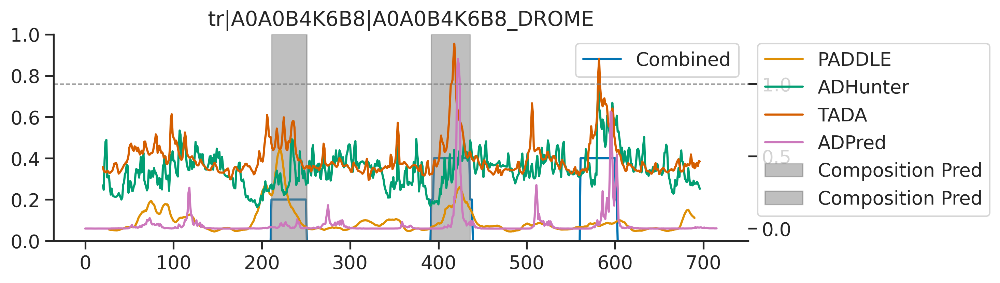

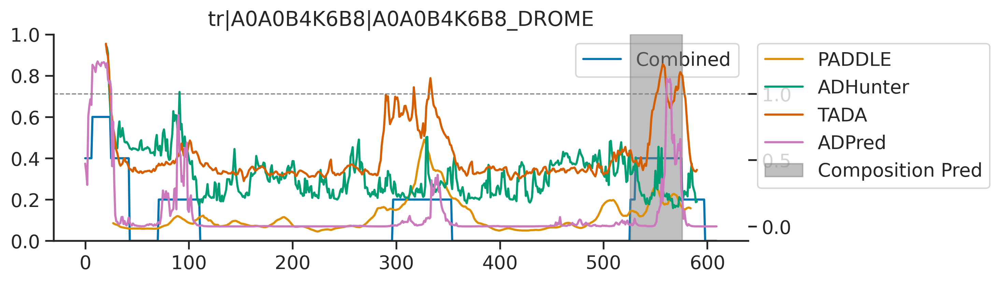

...

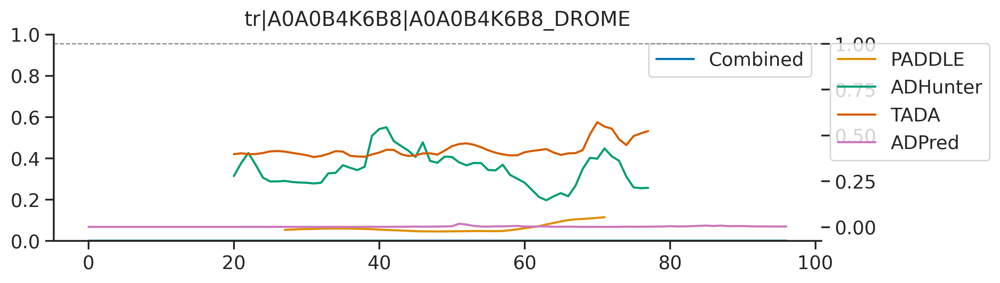

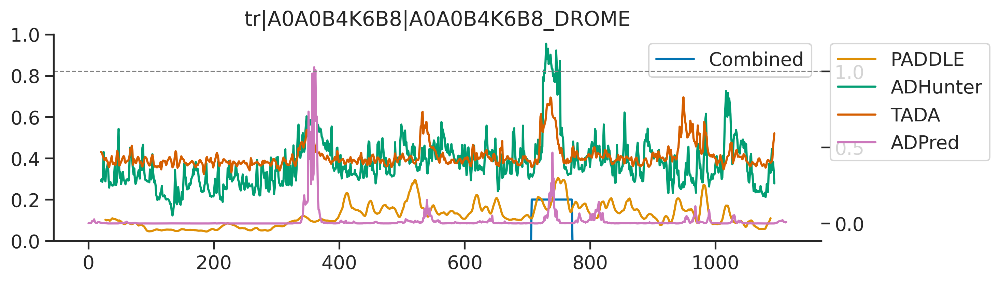

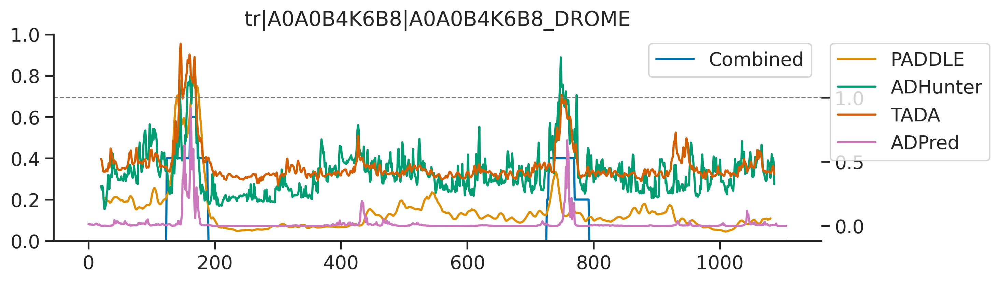

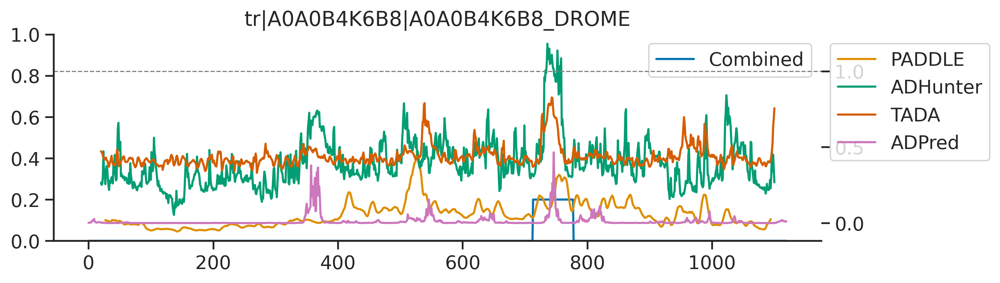

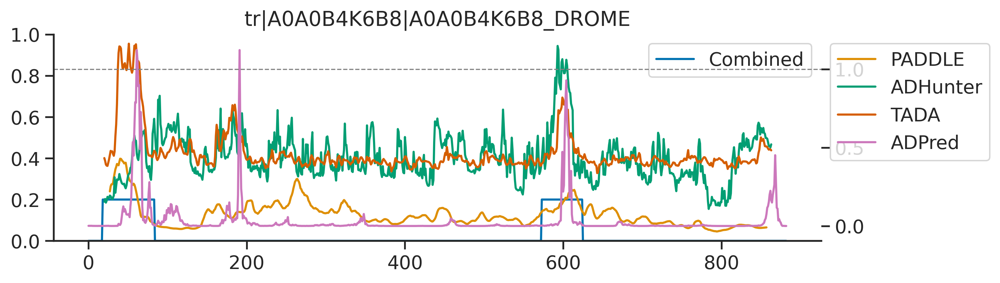

In [24]:
for i in preds.index:
    plot_all_predictors(preds, i)

# PARROT ready input

In [27]:
# Convert each list in combined_preds into separate columns
preds_df = preds['combined_preds'].apply(pd.Series)
preds_df
# # Join the new columns back to the original DataFrame (drop old combined_preds)
# lambert_TFs_with_preds = lambert_TFs_with_preds.drop(columns=['combined_preds'])
parrot_input = pd.concat([preds[['name']], preds_df], axis=1)
parrot_input
# # Save as proper TSV
# parrot_input.to_csv('../output/parrot_input.tsv', sep='\t', index=False, header=False)

,name,0,1,2,3,4,5,6,7,8,...,1110,1111,1112,1113,1114,1115,1116,1117,1118,1119
0,tr|A0A0B4K6B8|A0A0B4K6B8_DROME,0.4,0.4,0.4,0.4,0.4,0.4,0.4,0.6,0.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,tr|A0A0B4K7A6|A0A0B4K7A6_DROME,0.4,0.4,0.4,0.4,0.4,0.4,0.4,0.6,0.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,sp|A0A5S9MMK5|FPEB1_CAEEL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,sp|Q4VC44|FWCH1_HUMAN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,sp|Q86B87|MMD4_DROME,0.4,0.4,0.4,0.4,0.4,0.4,0.4,0.6,0.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,sp|Q18225|FLH2_CAEEL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,tr|Q6NP69|Q6NP69_DROME,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,sp|Q8CI03|FWCH1_MOUSE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,sp|Q9XWR1|FLH1_CAEEL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,sp|A8XJ98|FPEB1_CAEBR,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
